## Import Needed Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import LabelEncoder, MinMaxScaler , OneHotEncoder , StandardScaler
from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.feature_selection import SelectKBest, f_classif

from sklearn.ensemble import RandomForestClassifier
import pickle

from sklearn.metrics import accuracy_score, classification_report , confusion_matrix , ConfusionMatrixDisplay

from imblearn.over_sampling import SMOTE

import warnings
warnings.filterwarnings('ignore')
print('modules loaded')

modules loaded


## Read Data

In [ ]:
df = pd.read_csv('/content/first inten project.csv',index_col='Booking_ID')
df.head()

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,date of reservation,booking status
Booking_ID,,,,,,,,,,,,,,,,
INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.00,0,10/2/2015,Not_Canceled
INN00002,1,0,1,3,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,11/6/2018,Not_Canceled
INN00003,2,1,1,3,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,50.00,0,2/28/2018,Canceled
INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,1,5/20/2017,Canceled
INN00005,1,0,1,2,Not Selected,0,Room_Type 1,48,Online,0,0,0,77.00,0,4/11/2018,Canceled


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 36285 entries, INN00001 to INN36286
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   number of adults          36285 non-null  int64  
 1   number of children        36285 non-null  int64  
 2   number of weekend nights  36285 non-null  int64  
 3   number of week nights     36285 non-null  int64  
 4   type of meal              36285 non-null  object 
 5   car parking space         36285 non-null  int64  
 6   room type                 36285 non-null  object 
 7   lead time                 36285 non-null  int64  
 8   market segment type       36285 non-null  object 
 9   repeated                  36285 non-null  int64  
 10  P-C                       36285 non-null  int64  
 11  P-not-C                   36285 non-null  int64  
 12  average price             36285 non-null  float64
 13  special requests          36285 non-null  int64  
 14  d

In [ ]:
df.describe(include='all')

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,date of reservation,booking status
count,36285.000000,36285.000000,36285.000000,36285.000000,36285,36285.000000,36285,36285.000000,36285,36285.000000,36285.000000,36285.000000,36285.000000,36285.000000,36285,36285
unique,NaN,NaN,NaN,NaN,4,NaN,7,NaN,5,NaN,NaN,NaN,NaN,NaN,553,2
top,NaN,NaN,NaN,NaN,Meal Plan 1,NaN,Room_Type 1,NaN,Online,NaN,NaN,NaN,NaN,NaN,10/13/2018,Not_Canceled
freq,NaN,NaN,NaN,NaN,27842,NaN,28138,NaN,23221,NaN,NaN,NaN,NaN,NaN,254,24396
mean,1.844839,0.105360,0.810693,2.204602,NaN,0.030977,NaN,85.239851,NaN,0.025630,0.023343,0.153369,103.421636,0.619733,NaN,NaN
std,0.518813,0.402704,0.870590,1.410946,NaN,0.173258,NaN,85.938796,NaN,0.158032,0.368281,1.753931,35.086469,0.786262,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,NaN,0.000000,NaN,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,NaN,NaN
25%,2.000000,0.000000,0.000000,1.000000,NaN,0.000000,NaN,17.000000,NaN,0.000000,0.000000,0.000000,80.300000,0.000000,NaN,NaN
50%,2.000000,0.000000,1.000000,2.000000,NaN,0.000000,NaN,57.000000,NaN,0.000000,0.000000,0.000000,99.450000,0.000000,NaN,NaN
75%,2.000000,0.000000,2.000000,3.000000,NaN,0.000000,NaN,126.000000,NaN,0.000000,0.000000,0.000000,120.000000,1.000000,NaN,NaN


In [ ]:
for i in df.columns:
    if i not in ['average price ','date of reservation','lead time']:
        fig=px.pie(df,names=i,title=f"count {i}")
        fig.update_traces(textposition='inside', textinfo='value+percent')
        fig.show()

In [ ]:
count_adult_room=px.pie(df,names='room type',values='number of adults',title='room_type by number of adults')
count_adult_room.show()

In [ ]:
count_adult_status=px.pie(df,names='booking status',values='number of adults',title='booking status by number of adults')
count_adult_status.update_traces(textposition='inside', textinfo='label+percent')
count_adult_status.show()

In [ ]:
count_weekend_nights_room=px.pie(df,names='room type',values='number of weekend nights',title='room_type by number of weekend nights')
count_weekend_nights_room.show()

In [ ]:
count_lead_time_room=px.pie(df,names='room type',values='lead time',title='room_type by lead time')
count_lead_time_room.show()

In [ ]:
count_average_price_room=px.pie(df,names='room type',values='average price ',title='room_type by average price')
count_average_price_room.show()

In [ ]:
fig = px.histogram(df, x="date of reservation",y='average price ',title='date of reservation by sum average price')
fig.show()

In [ ]:
fig = px.histogram(df, x="booking status", color="car parking space", marginal="rug",
                   hover_data=df.columns)
fig.show()

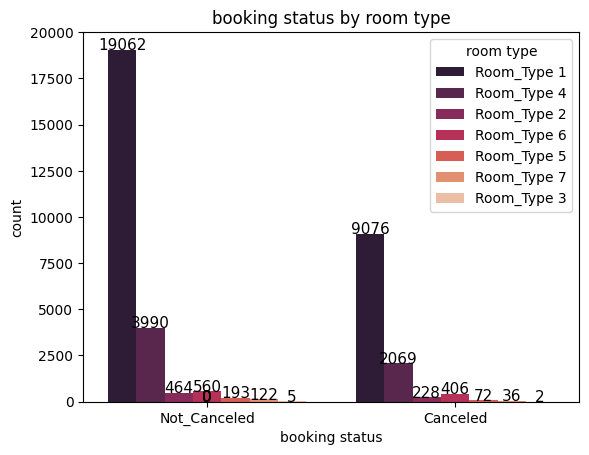

In [ ]:
ax=sns.countplot(data=df, x="booking status", hue="room type", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by room type")
plt.show()

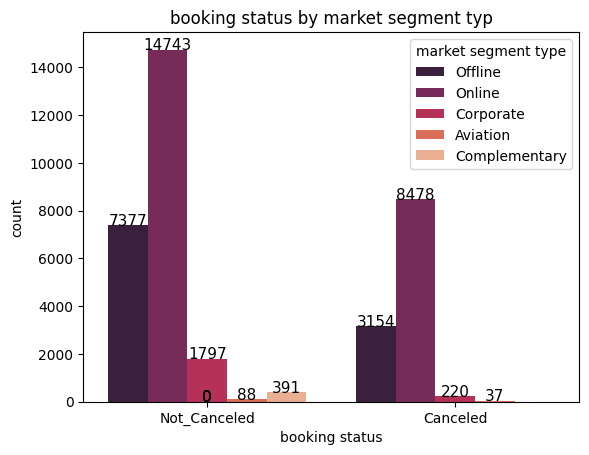

In [ ]:
ax=sns.countplot(data=df, x="booking status", hue="market segment type", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by market segment typ")
plt.show()

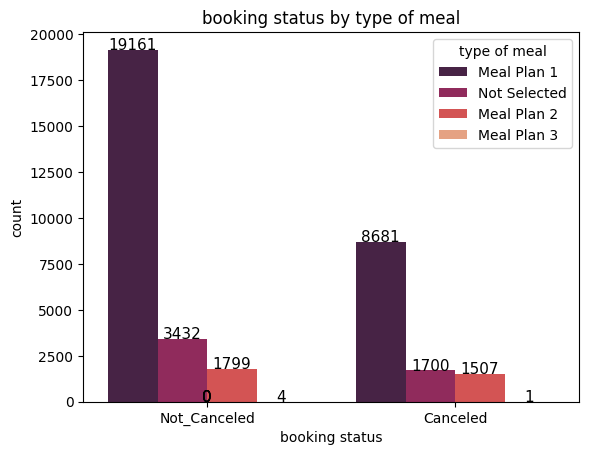

In [ ]:
ax=sns.countplot(data=df, x="booking status", hue="type of meal", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by type of meal")
plt.show()

In [ ]:
lead_time = px.histogram(df, x="lead time", title="Distribution of lead time")
lead_time.show()

In [ ]:
average_price = px.histogram(df, x="average price ")
average_price.show()

In [ ]:
date_status = px.histogram(df, x="date of reservation",color='booking status',title='count book status in date')
date_status.show()

In [ ]:
date_market = px.histogram(df, x="date of reservation",color='market segment type',title='count market segment type in date')
date_market.show()

In [ ]:
date_repeated = px.histogram(df, x="date of reservation",color='repeated',title='count repeated in date')
date_repeated.show()

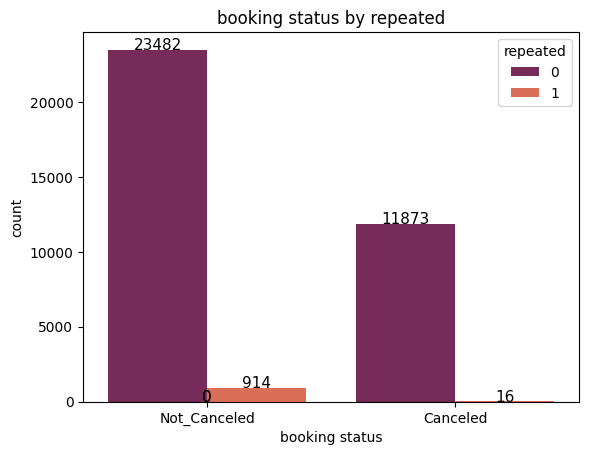

In [ ]:
ax=sns.countplot(data=df, x="booking status", hue="repeated", palette='rocket')
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}',
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha = 'center', fontsize=11, color='black', xytext=(0, 0), textcoords='offset points')
plt.title("booking status by repeated")
plt.show()

In [ ]:
count_average_price_status=px.pie(df,names='booking status',values='average price ',title='booking status by average price')
count_average_price_status.show()

In [ ]:
count_weekend_nights_status=px.pie(df,names='booking status',values='number of weekend nights',
                                   title='booking status by number of weekend nights')
count_weekend_nights_status.show()

In [ ]:
count_p_c_repeated=px.pie(df,names='P-C',values='repeated',title='bookings that were canceled by repeat')
count_p_c_repeated.show()

In [ ]:
p_c_repeated=px.histogram(df,x='P-C',color='repeated',title='bookings that were canceled by repeat')
p_c_repeated.show()

In [ ]:
count_repeated_p_not_c=px.histogram(df,x='P-not-C',color='repeated',title='repeat by previous bookings not canceled')
count_repeated_p_not_c.show()

In [ ]:
special_repeated = px.histogram(df, x="special requests",color='repeated',title='count special requests by repeated')
special_repeated.show()

In [ ]:
count_status_special_requests=px.histogram(df,x='special requests',color='booking status',title='bookings status by special requests')
count_status_special_requests.show()

In [ ]:
for i in df.columns:
    if i in ['average price ','lead time']:
      print(i)
      fig = px.box(df, y=i)
      fig.show()

lead time


average price 


## **preprocessing**

## check duplicates

In [ ]:
df.duplicated().sum()

10276

In [ ]:
df.drop_duplicates(inplace=True)

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

,0
number of adults,0
number of children,0
number of weekend nights,0
number of week nights,0
type of meal,0
car parking space,0
room type,0
lead time,0
market segment type,0
repeated,0


In [ ]:
df.dtypes

,0
number of adults,int64
number of children,int64
number of weekend nights,int64
number of week nights,int64
type of meal,object
car parking space,int64
room type,object
lead time,int64
market segment type,object
repeated,int64


## convert date of reservation to datetime

In [ ]:
# convert the date of reservation from object to datetime
df['date of reservation'] = pd.to_datetime(df['date of reservation'], infer_datetime_format=True, errors='coerce')

In [ ]:
# Extract from date of reservation information like year , day ,month
df['year'] = df['date of reservation'].dt.year
df['month'] = df['date of reservation'].dt.month
df['day'] = df['date of reservation'].dt.day

In [ ]:
# remove the orginal column because I not needed
df = df.drop('date of reservation', axis=1)

In [ ]:
df.head()

,number of adults,number of children,number of weekend nights,number of week nights,type of meal,car parking space,room type,lead time,market segment type,repeated,P-C,P-not-C,average price,special requests,booking status,year,month,day
Booking_ID,,,,,,,,,,,,,,,,,,
INN00001,1,1,2,5,Meal Plan 1,0,Room_Type 1,224,Offline,0,0,0,88.00,0,Not_Canceled,2015.0,10.0,2.0
INN00002,1,0,1,3,Not Selected,0,Room_Type 1,5,Online,0,0,0,106.68,1,Not_Canceled,2018.0,11.0,6.0
INN00003,2,1,1,3,Meal Plan 1,0,Room_Type 1,1,Online,0,0,0,50.00,0,Canceled,2018.0,2.0,28.0
INN00004,1,0,0,2,Meal Plan 1,0,Room_Type 1,211,Online,0,0,0,100.00,1,Canceled,2017.0,5.0,20.0
INN00005,1,0,1,2,Not Selected,0,Room_Type 1,48,Online,0,0,0,77.00,0,Canceled,2018.0,4.0,11.0


## check Null value

In [ ]:
df.isnull().sum()

,0
number of adults,0
number of children,0
number of weekend nights,0
number of week nights,0
type of meal,0
car parking space,0
room type,0
lead time,0
market segment type,0
repeated,0


In [ ]:
df.dropna(inplace=True)

In [ ]:
df[['day', 'month', 'year']] = df[['day', 'month', 'year']].astype(int)

In [ ]:
df.dtypes

,0
number of adults,int64
number of children,int64
number of weekend nights,int64
number of week nights,int64
type of meal,object
car parking space,int64
room type,object
lead time,int64
market segment type,object
repeated,int64


In [ ]:
for i in df.columns:
  if df[i].dtype == 'object':
    print(i)
    print(df[i].unique())

type of meal
['Meal Plan 1' 'Not Selected' 'Meal Plan 2' 'Meal Plan 3']
room type
['Room_Type 1' 'Room_Type 4' 'Room_Type 2' 'Room_Type 6' 'Room_Type 5'
 'Room_Type 7' 'Room_Type 3']
market segment type
['Offline' 'Online' 'Corporate' 'Aviation' 'Complementary']
booking status
['Not_Canceled' 'Canceled']


## label Encoder

In [ ]:
lb=LabelEncoder()
df['booking status']=lb.fit_transform(df['booking status'])

## OneHotEncoder

In [ ]:
columns_onehot=['type of meal','room type','market segment type']
encoder = OneHotEncoder(sparse_output=False)
one_hot_encoded = encoder.fit_transform(df[columns_onehot])
one_hot_df = pd.DataFrame(one_hot_encoded, columns=encoder.get_feature_names_out(columns_onehot))
df = pd.concat([df.reset_index(drop=True), one_hot_df.reset_index(drop=True)], axis=1)
df = df.drop(columns_onehot, axis=1)

In [ ]:
df

,number of adults,number of children,number of weekend nights,number of week nights,car parking space,lead time,repeated,P-C,P-not-C,average price,...,room type_Room_Type 3,room type_Room_Type 4,room type_Room_Type 5,room type_Room_Type 6,room type_Room_Type 7,market segment type_Aviation,market segment type_Complementary,market segment type_Corporate,market segment type_Offline,market segment type_Online
0,1,1,2,5,0,224,0,0,0,88.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
1,1,0,1,3,0,5,0,0,0,106.68,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2,1,1,3,0,1,0,0,0,50.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1,0,0,2,0,211,0,0,0,100.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,1,0,1,2,0,48,0,0,0,77.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25969,2,0,0,3,0,63,0,0,0,94.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
25970,2,0,2,3,0,5,0,0,0,106.68,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
25971,2,0,1,1,0,48,0,0,0,94.50,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
25972,2,0,1,3,0,34,0,0,0,107.55,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


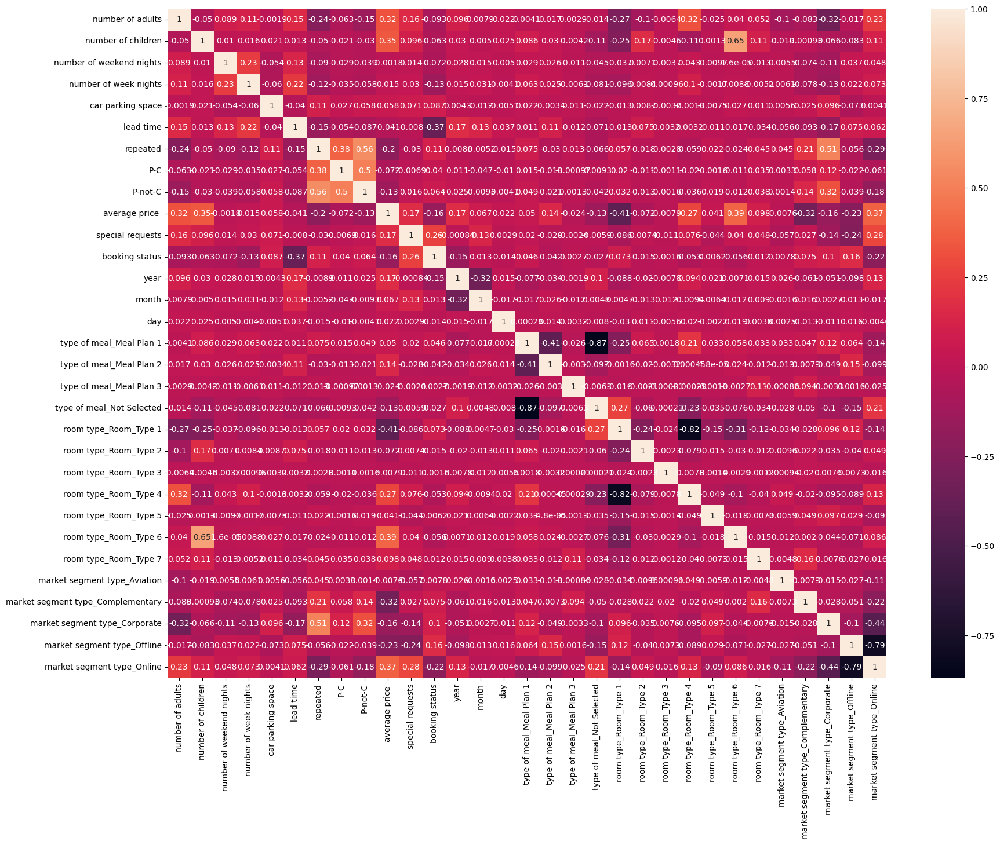

In [ ]:
plt.figure(figsize=(20 ,15))
sns.heatmap(df.corr(), annot=True)
plt.show()

## define features and target

In [ ]:
x=df.drop('booking status',axis=1)
y=df[['booking status']]

In [ ]:
df['booking status'].value_counts()

,count
booking status,
1,18535
0,7439


## Correcting the imbalance discovered by using resample

In [ ]:
oversample = SMOTE()
X_resampled, y_resampled = oversample.fit_resample(x, y)
x_sample=pd.DataFrame(X_resampled)
y_sample=pd.DataFrame(y_resampled)

datanew = pd.concat([x_sample,y_sample], axis=1)
df = datanew
print(f"The dataset now has {df.shape[0]} rows.")

The dataset now has 37070 rows.


In [ ]:
df['booking status'].value_counts()

,count
booking status,
1,18535
0,18535


In [ ]:
fig=px.pie(df,names='booking status',title=f"count booking status after sampling")
fig.update_traces(textposition='inside', textinfo='value+percent')
fig.show()

In [ ]:
x=df.drop(columns=['booking status'])
y=df[['booking status']]

## feature selection

In [ ]:
k_best = SelectKBest(score_func=f_classif)
x_kbest = k_best.fit_transform(x, y)
x_kbest = pd.DataFrame(x_kbest)
x_kbest.shape

(37070, 10)

In [ ]:
xdf=pd.DataFrame(x_kbest)
xdf.columns=x.columns[k_best.get_support()]
xdf

,car parking space,lead time,repeated,average price,special requests,year,market segment type_Complementary,market segment type_Corporate,market segment type_Offline,market segment type_Online
0,0.0,224.0,0.0,88.000000,0.0,2015.0,0.0,0.0,1.0,0.0
1,0.0,5.0,0.0,106.680000,1.0,2018.0,0.0,0.0,0.0,1.0
2,0.0,1.0,0.0,50.000000,0.0,2018.0,0.0,0.0,0.0,1.0
3,0.0,211.0,0.0,100.000000,1.0,2017.0,0.0,0.0,0.0,1.0
4,0.0,48.0,0.0,77.000000,0.0,2018.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...
37065,0.0,195.0,0.0,71.325302,0.0,2018.0,0.0,0.0,0.0,1.0
37066,0.0,81.0,0.0,134.770225,1.0,2018.0,0.0,0.0,0.0,1.0
37067,0.0,90.0,0.0,90.480583,0.0,2017.0,0.0,0.0,0.0,1.0
37068,0.0,214.0,0.0,95.113415,1.0,2018.0,0.0,0.0,0.0,1.0


## data scaling

In [ ]:
scaler=StandardScaler()
x_kbest=scaler.fit_transform(x_kbest)

## split data

In [ ]:
X_train,X_test,y_train,y_test=train_test_split(x_kbest,y,test_size=0.2,random_state=42,stratify=y)

## **RandomForest Model**

In [ ]:
rf=RandomForestClassifier(max_depth= 19, n_estimators= 300)
rf.fit(X_train,y_train)

RandomForestClassifier(max_depth=19, n_estimators=300)

In [ ]:
rf.score(X_train,y_train)

0.920319665497707

In [ ]:
y_pred_rf=rf.predict(X_test)

In [ ]:
print(accuracy_score(y_test,y_pred_rf))

0.8541947666576747


[[3138  569]
 [ 512 3195]]


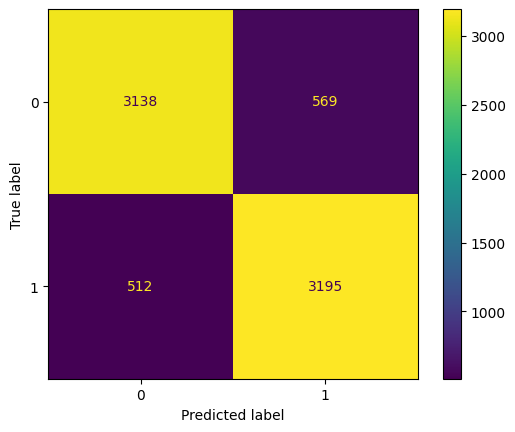

In [ ]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_rf)
print(confusion_matrix(y_test, y_pred_rf))

In [ ]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       0.86      0.85      0.85      3707
           1       0.85      0.86      0.86      3707

    accuracy                           0.85      7414
   macro avg       0.85      0.85      0.85      7414
weighted avg       0.85      0.85      0.85      7414



## Extract this model by pickle

In [ ]:
with open('rf_model.pkl', 'wb') as model_file:
        pickle.dump(rf, model_file)

with open('scaler.pkl', 'wb') as scaler_file:
        pickle.dump(scaler, scaler_file)